# Test 1: Fiducial N-body Code

The fiducial N-body code is run on an Eulerian scheme to solve for the gravity. This is obviously not ideal; however, it gives a good starting point for the simulations

In this notebook, I demonstrate some of the core functionality of the code.

In [18]:
import read_Cosmo_Nbody as rcn ### Python script to read in simulation output
import importlib

In [36]:
importlib.reload(rcn)

<module 'read_Cosmo_Nbody' from '/Users/aku7cf/Downloads/Shane/Nbody/read_Cosmo_Nbody.py'>

## Different Initial Conditions

While we start with a uniform box, it is possible to modify the code in such a way to create different initial conditions

This is not necessarily something that is built into the functionality of the code, but is an interesting test nonetheless

I provide video examples of a uniform box set-up as well as a "merging" system

### Uniform Box

In [5]:
### Brief look at the uniform box initial conditions
out_directory = './output/test1_uniform_snippet/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.make_movie(projection='3d')

Found: 
	500 particles
	3   dimensions
	100 snapshots


In [7]:
### Full 100,000 step integration of a uniform box
out_directory = './output/test1_uniform/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.make_movie(projection='xy')

Found: 
	500  particles
	3    dimensions
	1000 snapshots


### Merger Set-up

In [6]:
### Brief look at merger box set-up
out_directory = './output/test1_merger_snippet/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.make_movie(projection='3d')

Found: 
	500 particles
	3   dimensions
	100 snapshots


In [8]:
### Full 100,000 step integration of merger
out_directory = './output/test1_merger/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.make_movie(projection='xy')

Found: 
	500  particles
	3    dimensions
	1000 snapshots


## Periodic Box 

Since this is a simulation in a box, I either need to 

- Implement collision with the boundary
- Make the box wrap upon itself

I opt for the latter as it is more physical for a dark matter set-up. The likelihood of another DM particle entering your region of interest as another leaves it is higher than all of your particles colliding with an invisible barrier

Found: 
	50  particles
	3   dimensions
	300 snapshots


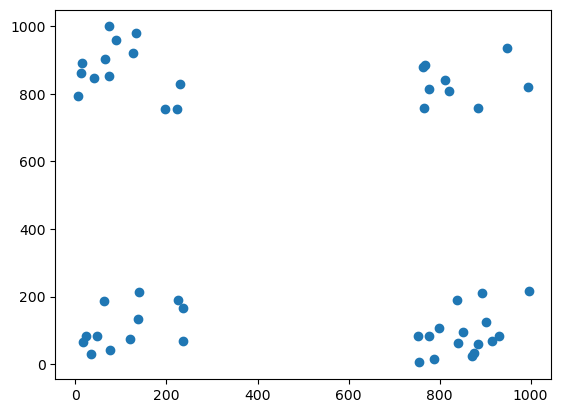

In [41]:
### 1 particle example of the periodicity of the box
out_directory = './output/test1_periodic_box/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.show_initial_condition(projection='xy')

The initial conditions of the above are such that the center of the particle initalization is in the upper right-hand corner. 
I did not make any explicit modifications to the code besides adding box wrapping to achieve this effect

In [42]:
particle_analyzer.make_movie(projection='3d')

In [43]:
particle_analyzer.make_movie(projection='xy')

## Gravitational Softening

One of the key challenges of this numerical framework is solving for gravity with particles at very small distances.
Consider the following...

\begin{equation}
    \lim_{r\to0} \frac{Gm_1m_2}{r} \to \infty
\end{equation}

Since these particles are collisionless, nothing is preventing them from getting arbitrarily close (or even overlapping).
Therefore, in some cases (like the one below) the velocities of these particles blow-up, sometimes in the first time step.

In [66]:
### No Gravitational Softening
out_directory = './output/test1_no_softening/'
particle_analyzer = rcn.Particle(out_directory)
particle_analyzer.make_movie(projection='xy')

Found: 
	200 particles
	3   dimensions
	300 snapshots


It is clear from this example that some particles just have absurdly large velocities for some non-negligible fraction of time in this simulation.

The inital speed is supposed to be somewhere between (-0.05, 0.05) units / s, but some particles almost instantly travel > 10 units in less than 10 snapshots (i.e., 1 second at dt = 0.1)

This is particularly clear when $m$ is small as well as when $L_{\rm box}$ is small